# Data Processing

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.fft import fft, fftfreq
from scipy.signal import spectrogram
import os

In [4]:
path_to_data = "C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\data"

data = {}

for filename in os.listdir(path_to_data):
    df = pd.read_csv(path_to_data + "\\" + filename)
    df = df.reset_index().rename(columns={'index': 'Sample Num'})

    data[filename[:-4]] = df



In [26]:
id_1 = 3
id_2 = 4

left_1 = data[f'sensor_data_left_{id_1}']
right_1 = data[f'sensor_data_right_{id_1}']
up_1 = data[f'sensor_data_up_{id_1}']
down_1 = data[f'sensor_data_down_{id_1}']

left_2 = data[f'sensor_data_left_{id_2}']
right_2 = data[f'sensor_data_right_{id_2}']
up_2 = data[f'sensor_data_up_{id_2}']
down_2 = data[f'sensor_data_down_{id_2}']



In [ ]:
def plot_data(dataset, acc, gesture, unique_id):
    fig, axs = plt.subplots(1, figsize=(7, 5))
    if acc:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_x'], label='acc_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_y'], label='acc_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_z'], label='acc_z')
        axs.set_title(f'Acceleration of sensor_data_{gesture}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Acceleration')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\acceleration_{gesture}_{unique_id}.png")
        plt.show()
    else:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_x'], label='gyro_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_y'], label='gyro_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_z'], label='gyro_z')
        axs.set_title(f'Angular Velocity of sensor_data_{gesture}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Angular Velocity')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\gyro_{gesture}_{unique_id}.png")
        plt.show()


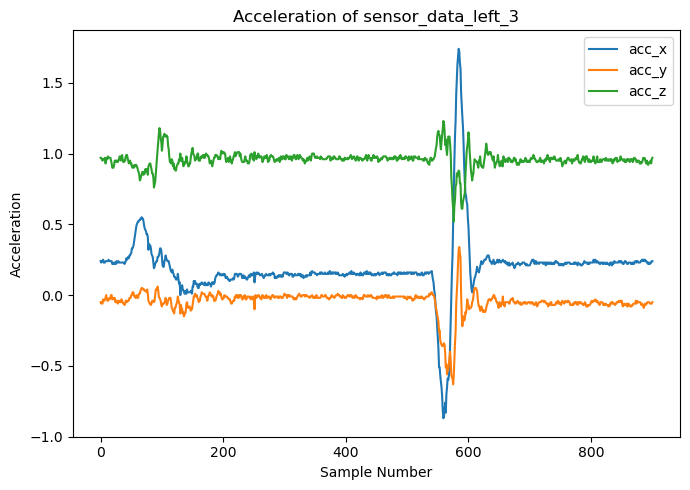

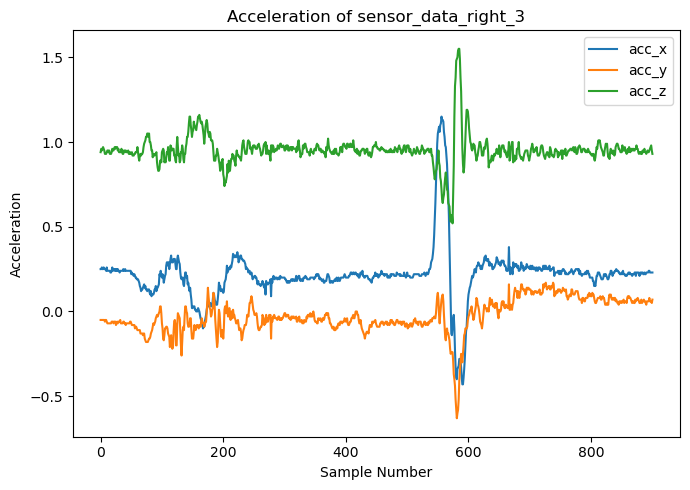

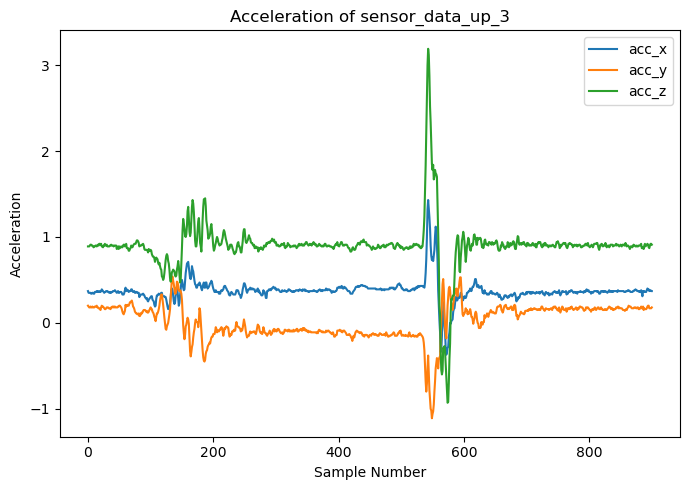

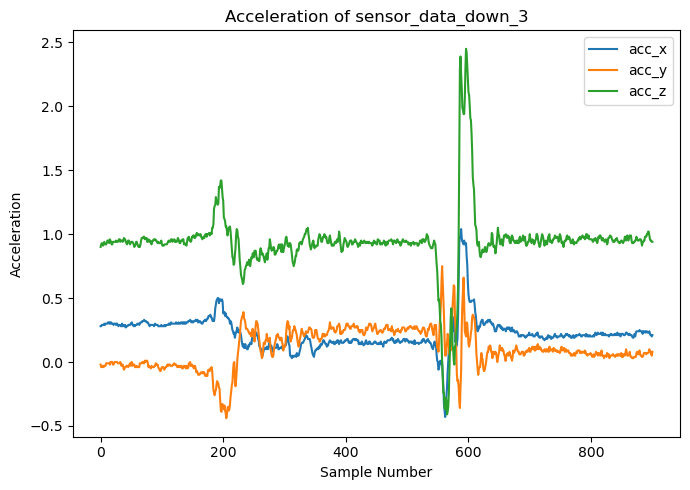

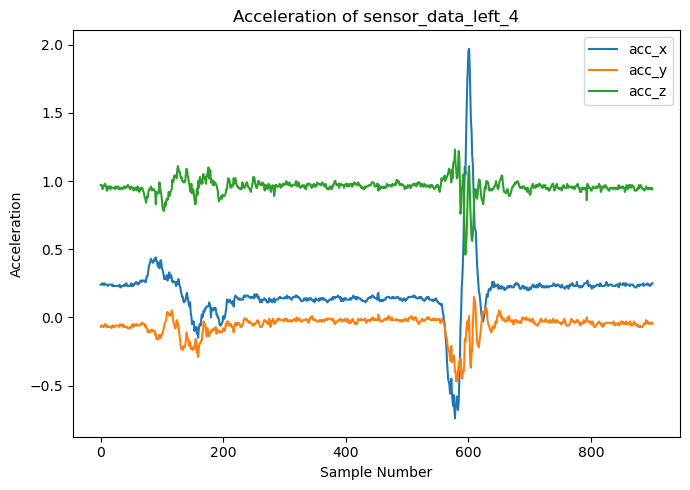

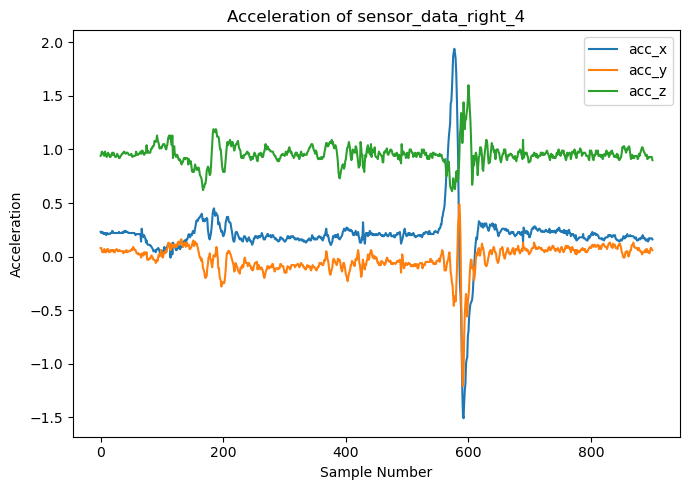

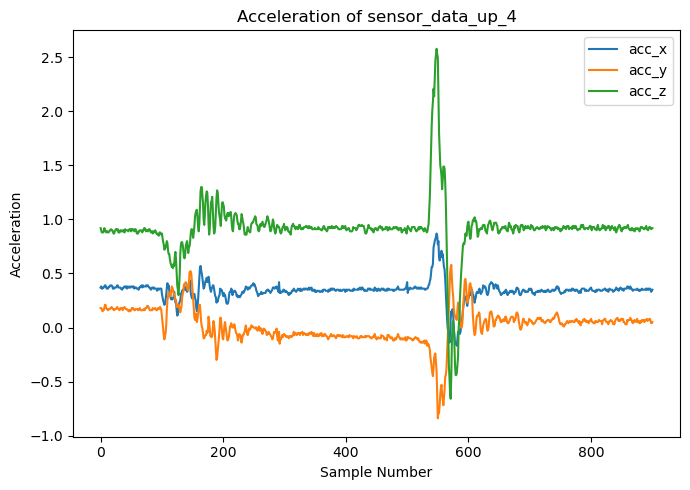

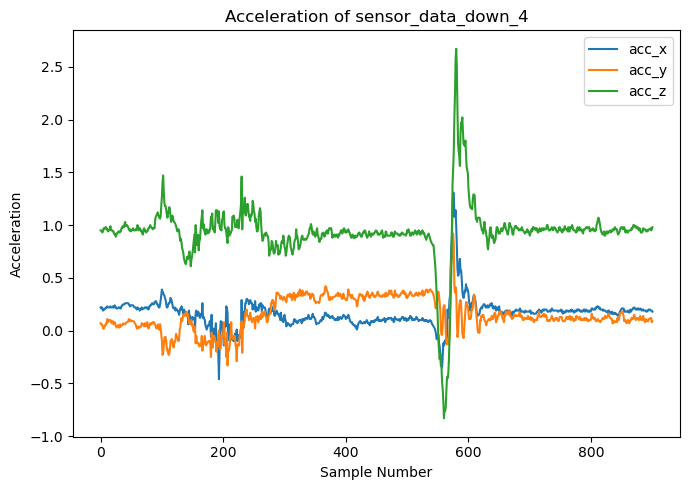

In [ ]:

plot_data(left_1, True, 'left', id_1)
plot_data(right_1, True, 'right', id_1)
plot_data(up_1, True, 'up', id_1)
plot_data(down_1, True, 'down', id_1)
plot_data(left_2, True, 'left', id_2)
plot_data(right_2, True, 'right', id_2)
plot_data(up_2, True, 'up', id_2)
plot_data(down_2, True, 'down', id_2)

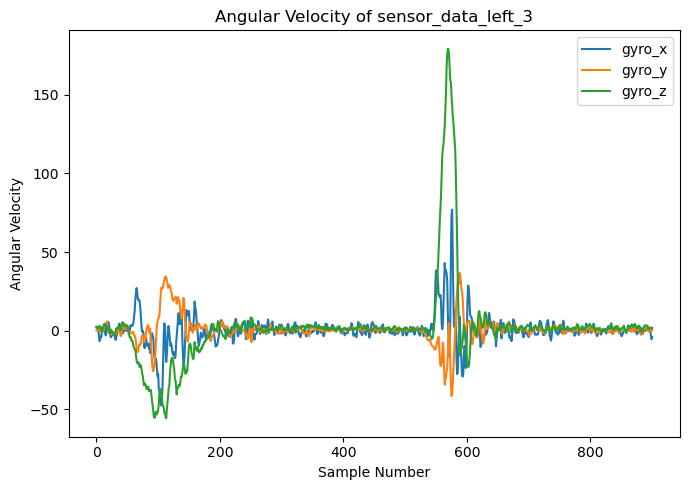

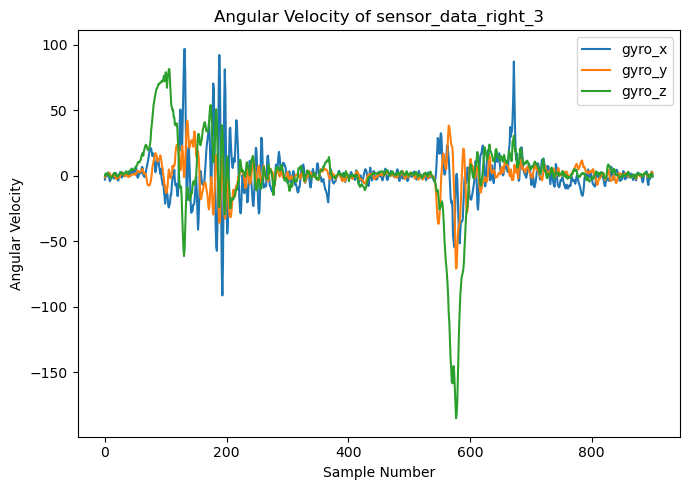

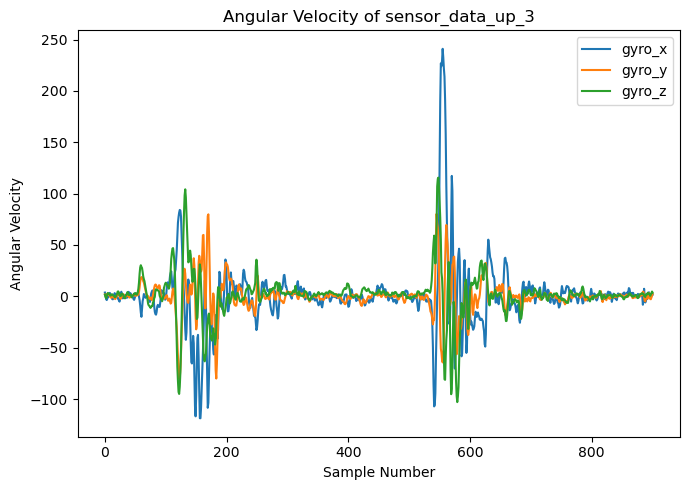

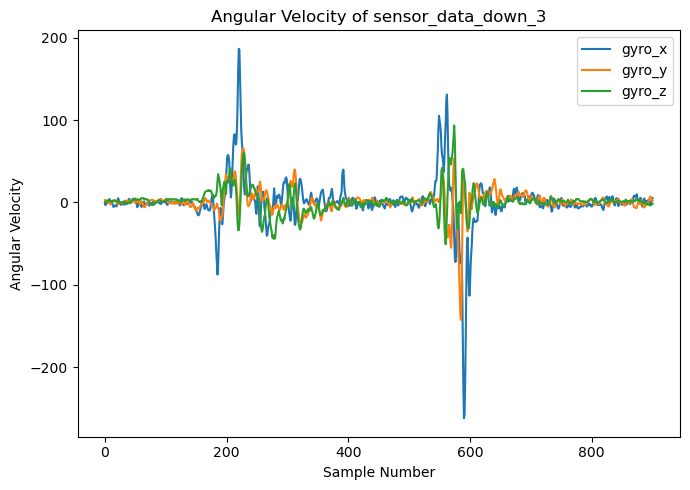

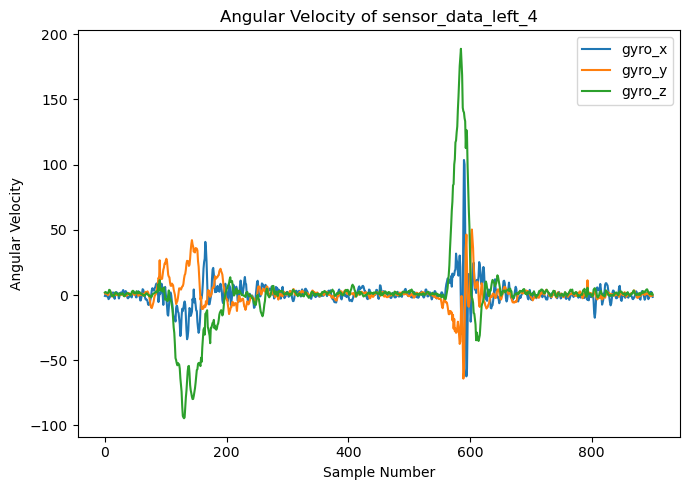

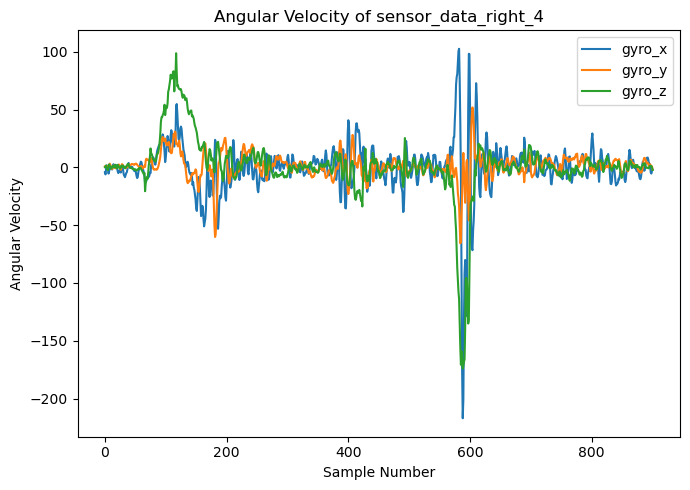

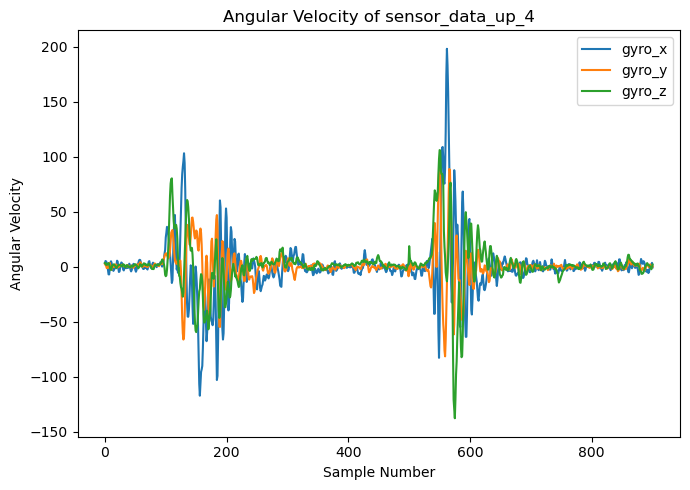

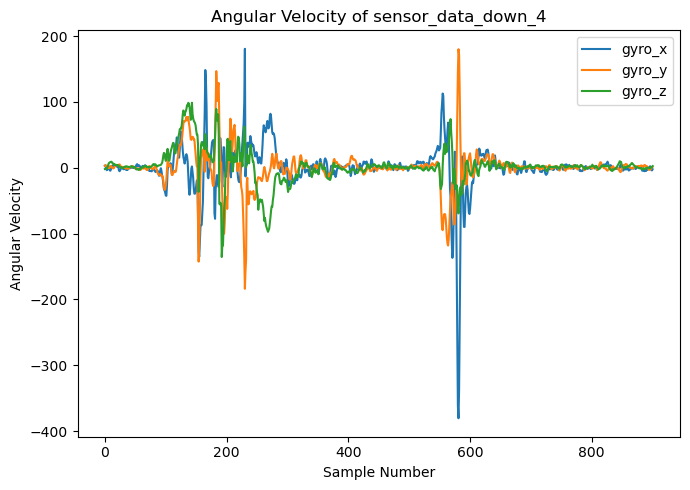

In [31]:
plot_data(left_1, False, 'left', id_1)
plot_data(right_1, False, 'right', id_1)
plot_data(up_1, False, 'up', id_1)
plot_data(down_1, False, 'down', id_1)
plot_data(left_2, False, 'left', id_2)
plot_data(right_2, False, 'right', id_2)
plot_data(up_2, False, 'up', id_2)
plot_data(down_2, False, 'down', id_2)

In [42]:
def plot_data(dataset, acc, gesture, unique_id):
    fig, axs = plt.subplots(1, figsize=(7, 5))
    if acc:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_x'], label='acc_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_y'], label='acc_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['acc_z'], label='acc_z')
        axs.set_title(f'Acceleration of sensor_data_{gesture}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Acceleration')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\acceleration_{gesture}_{unique_id}.png")
        plt.show()
    else:
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_x'], label='gyro_x')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_y'], label='gyro_y')
        sns.lineplot(ax=axs, x=dataset['Sample Num'], y=dataset['gyro_z'], label='gyro_z')
        axs.set_title(f'Angular Velocity of sensor_data_{gesture}_{unique_id}')
        axs.set(xlabel='Sample Number', ylabel='Angular Velocity')
        plt.tight_layout()
        plt.legend()
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\gyro_{gesture}_{unique_id}.png")
        plt.show()

def plot_spectrogram(dataset, acc, gesture, data_id):
    fig, axs = plt.subplots(1, 3, figsize=(21,7))
    plt_map = {
        "x": 0,
        "y": 1,
        "z": 2
    }
    data_dict = {}
    
    data_dict['x'] = dataset[f'{acc}_x']
    data_dict['y'] = dataset[f'{acc}_y']
    data_dict['z'] = dataset[f'{acc}_z']

    
    for axis in data_dict:
        data = data_dict[axis]
        axis_index = plt_map[axis]
        
        sampling_rate = data.shape[0] / 4
        segment_length = int(sampling_rate * .15)
        overlap = int(segment_length * .5)
        frequencies, times, Sxx = spectrogram(data, fs=sampling_rate, nperseg=segment_length, noverlap=overlap)
        
        pcm = axs[axis_index].pcolormesh(times, frequencies, 10 * np.log10(Sxx), shading='gouraud')
        axs[axis_index].set_ylabel('Frequency [Hz]')
        axs[axis_index].set_xlabel('Time [sec]')
        axs[axis_index].set_title(f'Spectrogram of {acc}_{axis} for sensor_data_{gesture}_{data_id}')

        
        plt.colorbar(pcm, ax=axs[axis_index], label='Intensity [dB]')

    plt.tight_layout()
    plt.legend()
    if acc == 'acc':
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\acceleration_spectro_{gesture}_{data_id}.png")
    else:
        plt.savefig(f"C:\\Users\\ryanz\\Documents\\CS528\\gesture_svm\\figures\\gyro_spectro_{gesture}_{data_id}.png")
    plt.show()


C:\Users\ryanz\AppData\Local\Temp\ipykernel_28676\3313984792.py:56: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


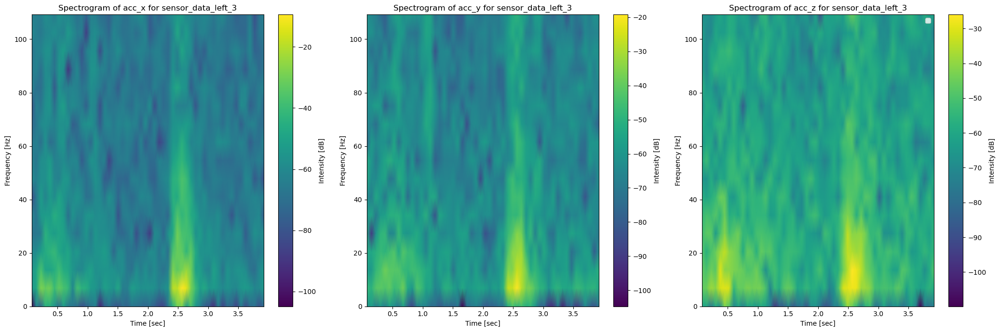

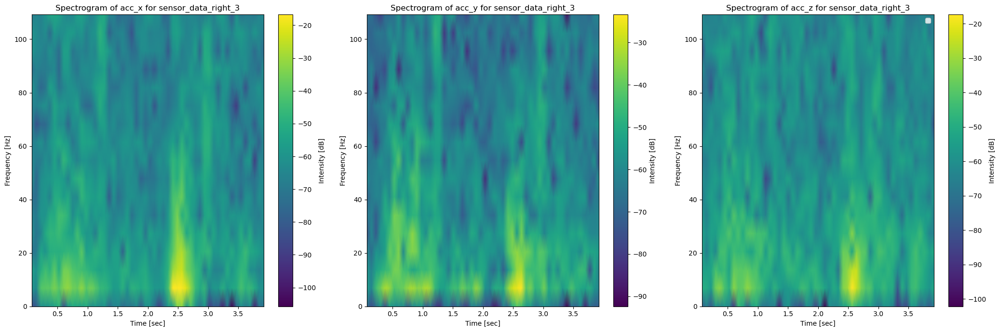

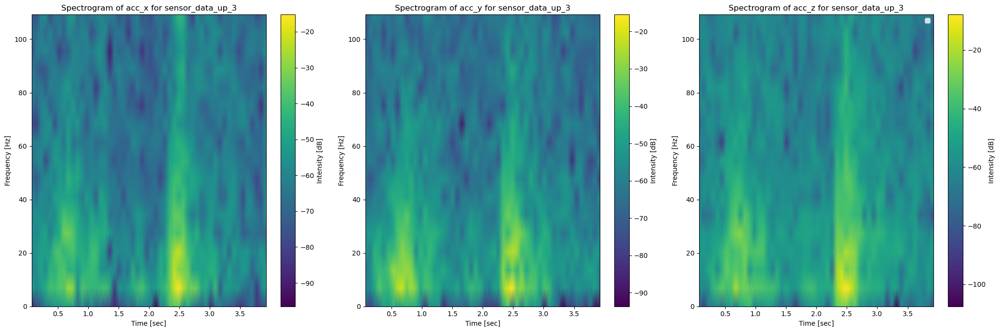

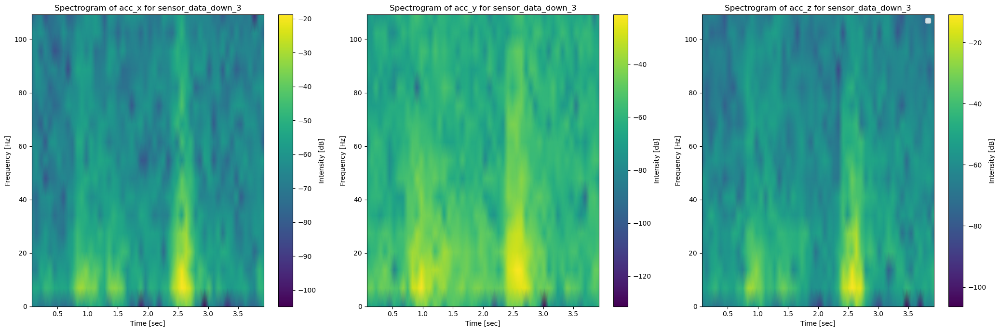

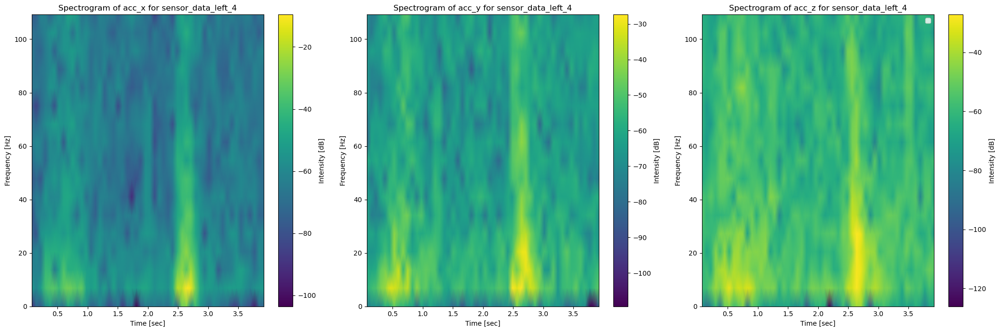

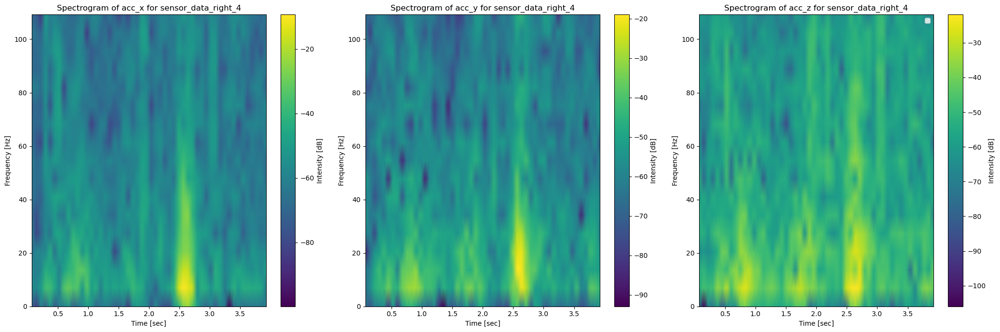

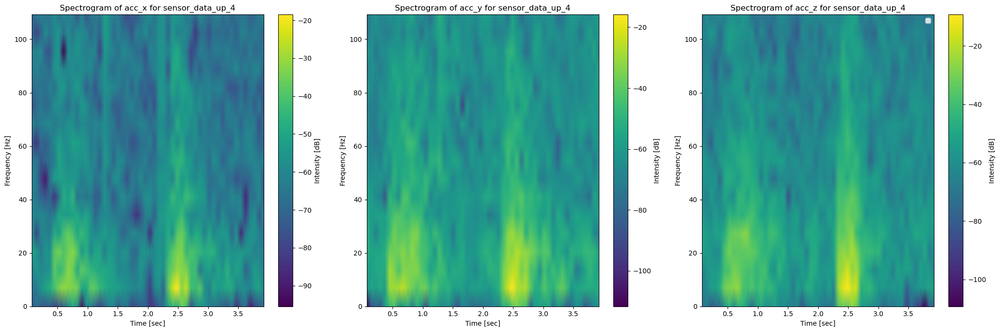

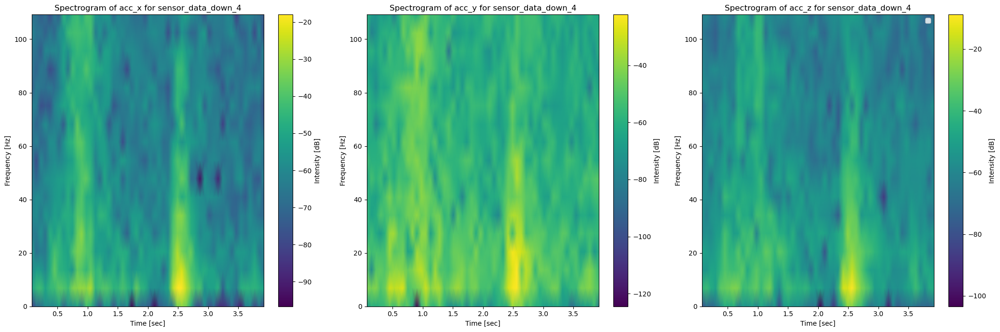

In [43]:
plot_spectrogram(left_1, 'acc', 'left', id_1)
plot_spectrogram(right_1, 'acc', 'right', id_1)
plot_spectrogram(up_1, 'acc', 'up', id_1)
plot_spectrogram(down_1, 'acc', 'down', id_1)
plot_spectrogram(left_2, 'acc', 'left', id_2)
plot_spectrogram(right_2, 'acc', 'right', id_2)
plot_spectrogram(up_2, 'acc', 'up', id_2)
plot_spectrogram(down_2, 'acc', 'down', id_2)

C:\Users\ryanz\AppData\Local\Temp\ipykernel_28676\3313984792.py:56: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


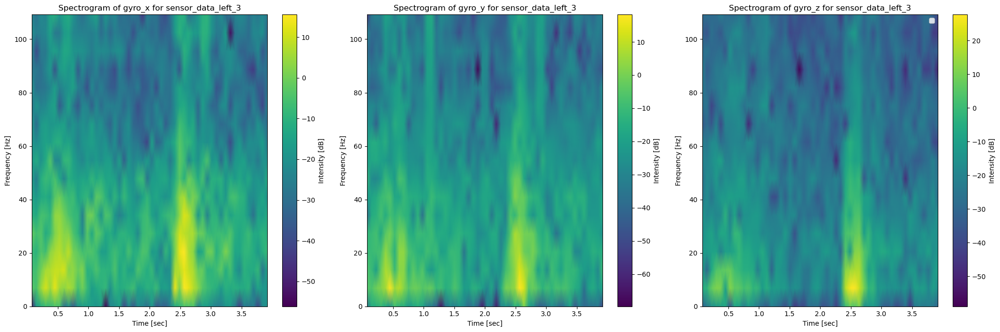

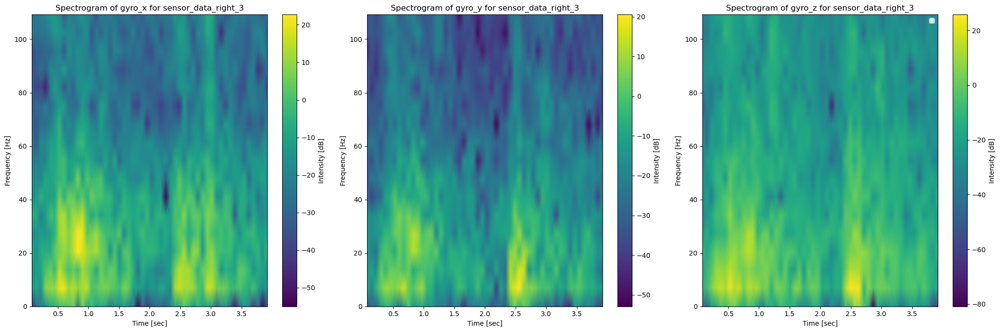

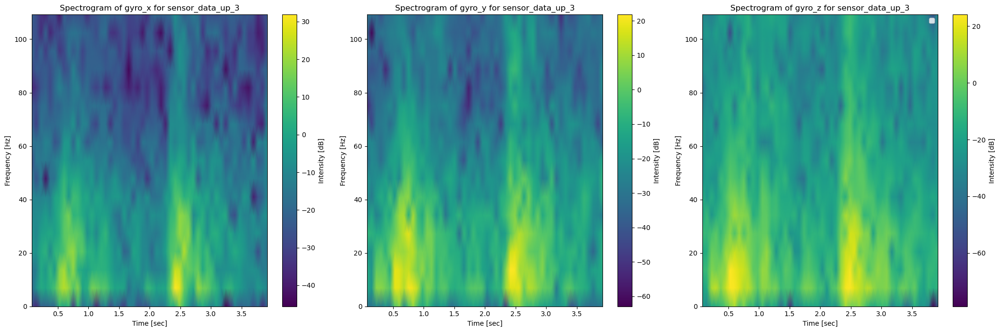

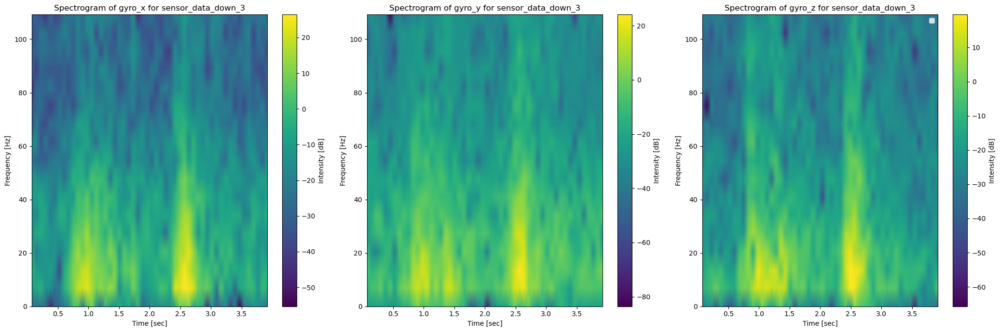

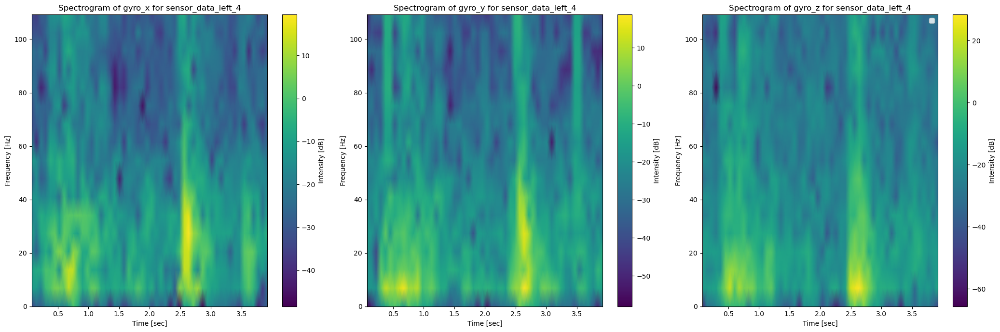

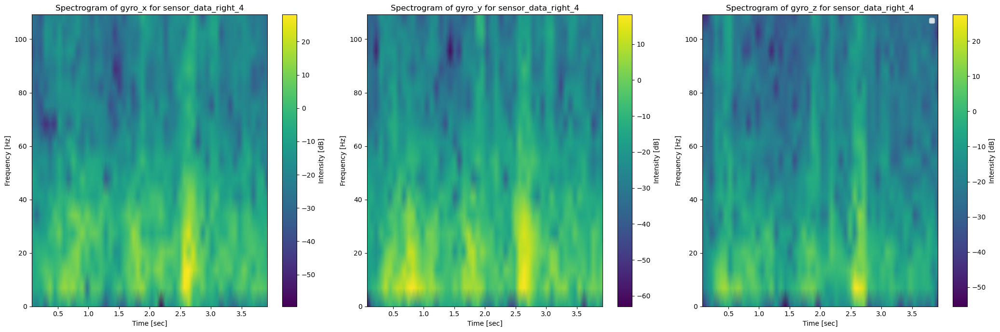

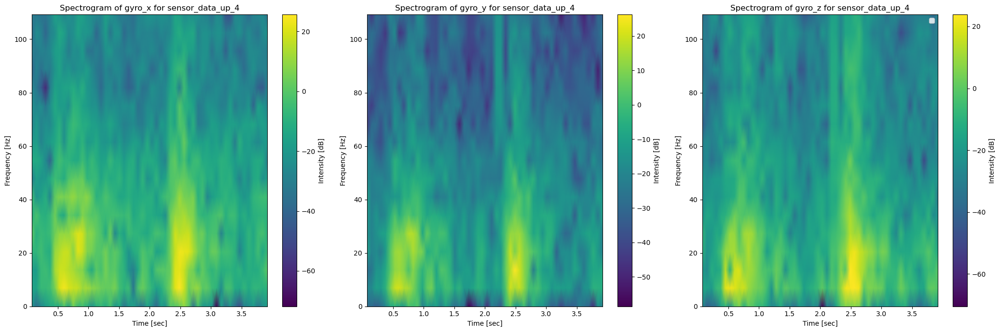

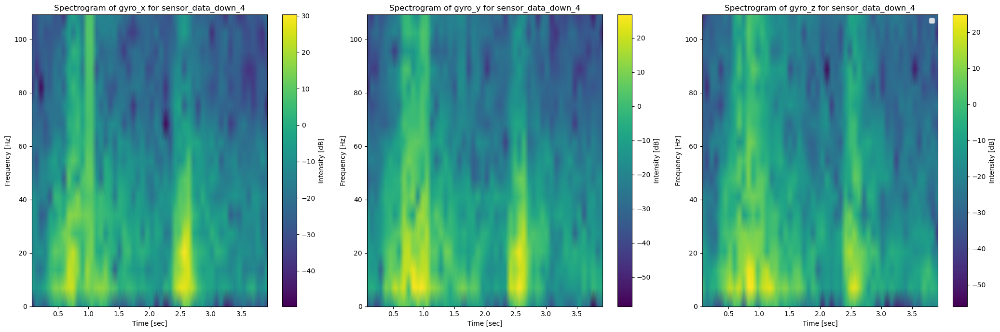

In [44]:
plot_spectrogram(left_1, 'gyro', 'left', id_1)
plot_spectrogram(right_1, 'gyro', 'right', id_1)
plot_spectrogram(up_1, 'gyro', 'up', id_1)
plot_spectrogram(down_1, 'gyro', 'down', id_1)
plot_spectrogram(left_2, 'gyro', 'left', id_2)
plot_spectrogram(right_2, 'gyro', 'right', id_2)
plot_spectrogram(up_2, 'gyro', 'up', id_2)
plot_spectrogram(down_2, 'gyro', 'down', id_2)

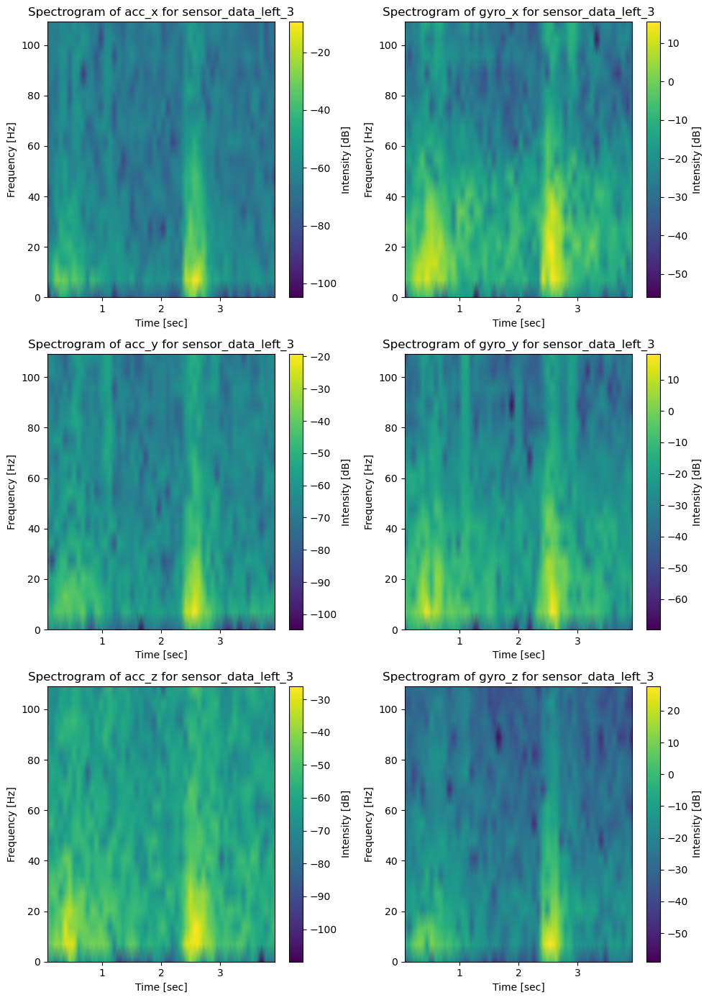

In [ ]:

# Pass each axis to the plot_spectrogram function for plotting
plot_spectrogram(left['acc_x'], left_id, 'acc_x', ax=axs[0, 0])
plot_spectrogram(left['acc_y'], left_id, 'acc_y', ax=axs[1, 0])
plot_spectrogram(left['acc_z'], left_id, 'acc_z', ax=axs[2, 0])
plot_spectrogram(left['gyro_x'], left_id, 'gyro_x', ax=axs[0, 1])
plot_spectrogram(left['gyro_y'], left_id, 'gyro_y', ax=axs[1, 1])
plot_spectrogram(left['gyro_z'], left_id, 'gyro_z', ax=axs[2, 1])


plt.tight_layout()
plt.show()


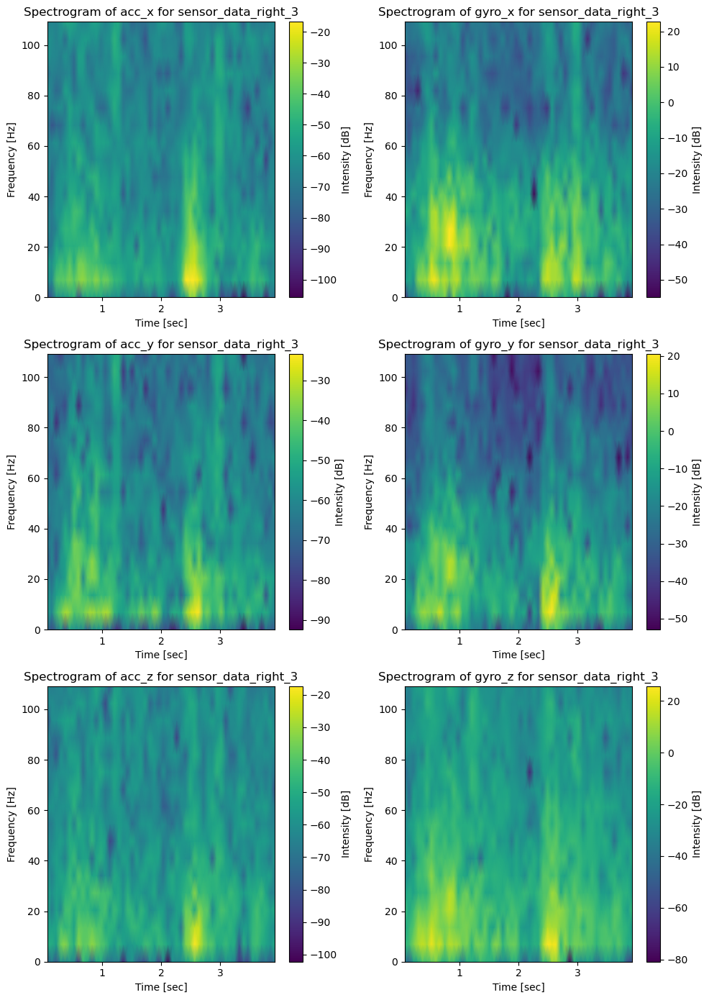

In [20]:
fig, axs = plt.subplots(3, 2, figsize=(10, 14))

# Pass each axis to the plot_spectrogram function for plotting
plot_spectrogram(right['acc_x'], right_id, 'acc_x', ax=axs[0, 0])
plot_spectrogram(right['acc_y'], right_id, 'acc_y', ax=axs[1, 0])
plot_spectrogram(right['acc_z'], right_id, 'acc_z', ax=axs[2, 0])
plot_spectrogram(right['gyro_x'], right_id, 'gyro_x', ax=axs[0, 1])
plot_spectrogram(right['gyro_y'], right_id, 'gyro_y', ax=axs[1, 1])
plot_spectrogram(right['gyro_z'], right_id, 'gyro_z', ax=axs[2, 1])


plt.tight_layout()
plt.show()
